## Libraries Used

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from glob import glob
import scipy.io as sio
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [2]:
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
import tensorflow.keras.layers as L
from tensorflow.keras.optimizers import Adam
import tensorflow_probability as tfp

from tensorflow.keras.initializers import Constant
from tensorflow.keras.backend import sigmoid, relu

2024-06-17 13:29:08.414585: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-17 13:29:08.414709: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-17 13:29:08.536320: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Data Loader

In [3]:
def load_image(path, size, mask=False):
    if mask:
        # Load .mat file for masks
        mask_data = sio.loadmat(path)["inst_map"]  # Adjust the key according to your .mat file structure
        mask_data = cv2.resize(mask_data, (size, size), interpolation=cv2.INTER_NEAREST)
        mask_data = (mask_data > 0).astype('uint8') * 255
        mask_data = mask_data.astype('float32') / 255.0
        return mask_data
    else:
        # Load and resize image using OpenCV
        image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (size, size))
        image = image.astype('float32') / 255.0
        return image

def load_data(root_path, size):
    images = []
    masks = []

    image_folder = os.path.join(root_path, 'Images')
    mask_folder = os.path.join(root_path, 'Labels')

    for image_path in sorted(glob(os.path.join(image_folder, '*.png'))):
        img_id = os.path.basename(image_path).split('.')[0]
        mask_path = os.path.join(mask_folder, f'{img_id}.mat')

        img = load_image(image_path, size, mask=False)
        mask = load_image(mask_path, size, mask=True)

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

In [4]:
size = 256   # image size: 256x256
root_path = '/kaggle/input/tnbc-seg/CPM 17/cpm17/train'
X_train, y_train = load_data(root_path, size)

size = 256   # image size: 256x256
root_path = '/kaggle/input/tnbc-seg/CPM 17/cpm17/test'
X_test, y_test = load_data(root_path, size)

In [5]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=35)

print('X_train shape:',X_train.shape)
print('y_train shape:',y_train.shape)
print('X_val shape:',X_val.shape)
print('X_test shape:',X_test.shape)
print('y_test shape:',y_test.shape)

X_train shape: (25, 256, 256, 3)
y_train shape: (25, 256, 256)
X_val shape: (7, 256, 256, 3)
X_test shape: (32, 256, 256, 3)
y_test shape: (32, 256, 256)


In [6]:
def horizontal_flip(image, mask):
    flipped_image = np.fliplr(image)
    flipped_mask = np.fliplr(mask)
    return flipped_image, flipped_mask

def vertical_flip(image, mask):
    flipped_image = np.flipud(image)
    flipped_mask = np.flipud(mask)
    return flipped_image, flipped_mask

def rotate_90(image, mask):
    rotated_image = np.rot90(image)
    rotated_mask = np.rot90(mask)
    return rotated_image, rotated_mask

def rotate_270(image, mask):
    rotated_image = np.rot90(image, -1)
    rotated_mask = np.rot90(mask, -1)
    return rotated_image, rotated_mask

augmented_X_train = []
augmented_y_train = []

for i in range(len(X_train)):
    image = X_train[i]
    mask = y_train[i]
    
    augmented_X_train.append(image)
    augmented_y_train.append(mask)

    # Horizontal flip
    h_flip_image, h_flip_mask = horizontal_flip(image, mask)
    augmented_X_train.append(h_flip_image)
    augmented_y_train.append(h_flip_mask)

    # Vertical flip
    v_flip_image, v_flip_mask = vertical_flip(image, mask)
    augmented_X_train.append(v_flip_image)
    augmented_y_train.append(v_flip_mask)

    # Rotate 90 degrees
    rot_90_image, rot_90_mask = rotate_90(image, mask)
    augmented_X_train.append(rot_90_image)
    augmented_y_train.append(rot_90_mask)

    # Rotate 270 degrees
    rot_270_image, rot_270_mask = rotate_270(image, mask)
    augmented_X_train.append(rot_270_image)
    augmented_y_train.append(rot_270_mask)

augmented_X_train = np.array(augmented_X_train)
augmented_y_train = np.array(augmented_y_train)

print("Augmented X_train shape:", augmented_X_train.shape)
print("Augmented y_train shape:", augmented_y_train.shape)

Augmented X_train shape: (125, 256, 256, 3)
Augmented y_train shape: (125, 256, 256)


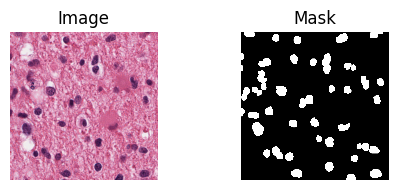

In [7]:
image = augmented_X_train[52]
mask = augmented_y_train[52]

fig, axes = plt.subplots(1, 2, figsize=(5, 2))
axes[0].imshow(image, cmap='gray')
axes[0].axis('off')
axes[0].set_title('Image')

axes[1].imshow(mask*255, cmap='gray', vmin=0, vmax=1)
axes[1].axis('off')
axes[1].set_title('Mask')

plt.tight_layout()
plt.show()

## Metrics and Losses

In [8]:
def dice_score(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    score = (2. * intersection + smooth) / (K.sum(y_true_flat) + K.sum(y_pred_flat) + smooth)
    return score

def iou(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat) - intersection + smooth
    iou = (intersection + smooth) / union
    return iou

def sensitivity(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fn = K.sum(y_true_flat * (1 - y_pred_flat))
    recall = (tp + smooth) / (tp + fn + smooth)
    return recall

def specificity(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tn = K.sum((1 - y_true_flat) * (1 - y_pred_flat))
    fp = K.sum((1 - y_true_flat) * y_pred_flat)
    spec = (tn + smooth) / (tn + fp + smooth)
    return spec

def precision(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fp = K.sum((1 - y_true_flat) * y_pred_flat)
    precision = (tp + smooth) / (tp + fp + smooth)
    return precision

In [9]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_score(y_true, y_pred)
    return loss

def iou_loss(y_true, y_pred):
    loss = 1 - iou(y_true, y_pred)
    return loss
    
def bce_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true, logits=y_pred))
    return loss

def combined_loss(y_true, y_pred):
    loss = dice_loss(y_true, y_pred) + iou_loss(y_true, y_pred)
    return loss

## Model

In [10]:
import tensorflow as tf
from tensorflow.keras.layers import *

class MSAG(tf.keras.layers.Layer):
    def __init__(self, channels):
        super(MSAG, self).__init__()
        self.channels = channels
        self.pointwise_conv = Conv2D(self.channels, (1, 1), padding='same')
        self.ordinary_conv = Conv2D(self.channels, (3, 3), padding='same')
        self.dilation_conv = Conv2D(self.channels, (3, 3), padding='same', dilation_rate=2)
        self.batch_norm = BatchNormalization()
        self.relu = ReLU()
        self.vote_conv = Conv2D(self.channels, (1, 1), padding='same', activation='sigmoid')

    def call(self, x):
        x1 = self.pointwise_conv(x)
        x1 = self.batch_norm(x1)
        x2 = self.ordinary_conv(x)
        x2 = self.batch_norm(x2)
        x3 = self.dilation_conv(x)
        x3 = self.batch_norm(x3)
        concatenated = self.relu(tf.concat([x1, x2, x3], axis=-1))
        attention = self.vote_conv(concatenated)
        return x * attention + x

def conv_block(x, filters):
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

def up_conv_block(x, filters):
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

def conv_mixer_block(x, filters, depth, kernel_size):
    for _ in range(depth):
        residual = x
        x = Conv2D(filters, (kernel_size, kernel_size), padding='same', groups=filters)(x)
        x = ReLU()(x)
        x = BatchNormalization()(x)
        x = Conv2D(filters, (1, 1))(x)
        x = ReLU()(x)
        x = BatchNormalization()(x)
        x = Add()([x, residual])
    return x

def CMUNet(input_shape, output_channels, l=7, k=7):
    inputs = Input(input_shape)

    # Encoder
    c1 = conv_block(inputs, 64)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

    c5 = conv_block(p4, 1024)
    cm = conv_mixer_block(c5, 1024, depth=l, kernel_size=k)

    # Decoder with skip connections and MSAG
    msag4 = MSAG(512)
    msag3 = MSAG(256)
    msag2 = MSAG(128)
    msag1 = MSAG(64)

    u5 = up_conv_block(cm, 512)
    u5 = Concatenate()([msag4(c4), u5])
    u5 = conv_block(u5, 512)

    u4 = up_conv_block(u5, 256)
    u4 = Concatenate()([msag3(c3), u4])
    u4 = conv_block(u4, 256)

    u3 = up_conv_block(u4, 128)
    u3 = Concatenate()([msag2(c2), u3])
    u3 = conv_block(u3, 128)

    u2 = up_conv_block(u3, 64)
    u2 = Concatenate()([msag1(c1), u2])
    u2 = conv_block(u2, 64)

    outputs = Conv2D(output_channels, (1, 1), activation='sigmoid')(u2)

    model = Model(inputs, outputs)
    return model


input_shape = (256, 256, 3)
output_channels = 1
model = CMUNet(input_shape, output_channels)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss=combined_loss, metrics=["accuracy", dice_score, sensitivity, specificity, iou], optimizer=optimizer)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ re_lu[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ re_lu_2[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_4[0][0]  

 Total params: 49,970,881 (190.62 MB)

 Trainable params: 49,926,593 (190.45 MB)

 Non-trainable params: 44,288 (173.00 KB)

## Training

In [11]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath='/kaggle/working/model.weights.h5',
    monitor='val_dice_score',
    save_best_only=True,
    save_weights_only=True,
    mode='max',
    verbose=1
    )

history = model.fit(augmented_X_train, augmented_y_train,
                    epochs = 100,
                    batch_size = 4,
                    validation_data = (X_val,y_val),
                    verbose = 1,
                    callbacks=[model_checkpoint_callback],
                    shuffle = True)

Epoch 1/100


2024-06-17 13:30:00.277381: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.24577, expected 2.80959
2024-06-17 13:30:00.277457: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 179: 3.17396, expected 2.73778
2024-06-17 13:30:00.277917: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 3.15611, expected 2.41005
2024-06-17 13:30:00.277960: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 3.84262, expected 3.09657
2024-06-17 13:30:00.277977: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 4.59187, expected 3.84581
2024-06-17 13:30:00.277987: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 5.43123, expected 4.68518
2024-06-17 13:30:00.277996: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 5.1009, expected 4.35484
2024-06-17 13:30:00.278004: E exte

31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8412 - dice_score: 0.4868 - iou: 0.3376 - loss: 1.1757 - sensitivity: 0.5575 - specificity: 0.9234

2024-06-17 13:30:52.512970: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 2.86272, expected 2.0465
2024-06-17 13:30:52.513028: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.04967, expected 3.23345
2024-06-17 13:30:52.513044: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.4326, expected 3.61638
2024-06-17 13:30:52.513063: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.46868, expected 4.65247
2024-06-17 13:30:52.513075: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.37814, expected 4.56193
2024-06-17 13:30:52.513085: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.18374, expected 4.36753
2024-06-17 13:30:52.513096: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.54872, expected 4.7325
2024-06-17 13:30:52.513106: E external/local_xla/xla/servi

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8421 - dice_score: 0.4906 - iou: 0.3410 - loss: 1.1686 - sensitivity: 0.5631 - specificity: 0.9230   

2024-06-17 13:31:21.368830: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.23283, expected 2.3641
2024-06-17 13:31:21.369050: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.64338, expected 3.77466
2024-06-17 13:31:21.369106: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.22613, expected 4.3574
2024-06-17 13:31:21.369144: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.62769, expected 4.75897
2024-06-17 13:31:21.369182: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 6.08293, expected 5.2142
2024-06-17 13:31:21.369226: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 6.17534, expected 5.30661
2024-06-17 13:31:21.369260: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.74108, expected 4.87236
2024-06-17 13:31:21.369292: E external/local_xla/xla/servi


Epoch 1: val_dice_score improved from -inf to 0.24808, saving model to /kaggle/working/model.weights.h5
32/32 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.8429 - dice_score: 0.4941 - iou: 0.3443 - loss: 1.1620 - sensitivity: 0.5683 - specificity: 0.9226 - val_accuracy: 0.8094 - val_dice_score: 0.2481 - val_iou: 0.1424 - val_loss: 1.5986 - val_sensitivity: 2.7384e-12 - val_specificity: 1.0000
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.8983 - dice_score: 0.7283 - iou: 0.5757 - loss: 0.6961 - sensitivity: 0.8406 - specificity: 0.9171
Epoch 2: val_dice_score did not improve from 0.24808
32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - accuracy: 0.8983 - dice_score: 0.7283 - iou: 0.5757 - loss: 0.6960 - sensitivity: 0.8406 - specificity: 0.9171 - val_accuracy: 0.8094 - val_dice_score: 0.2264 - val_iou: 0.1282 - val_loss: 1.6367 - val_sensitivity: 2.7384e-12 - val_specificity: 1.0000
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.9147 - dice_score: 0

## Testing

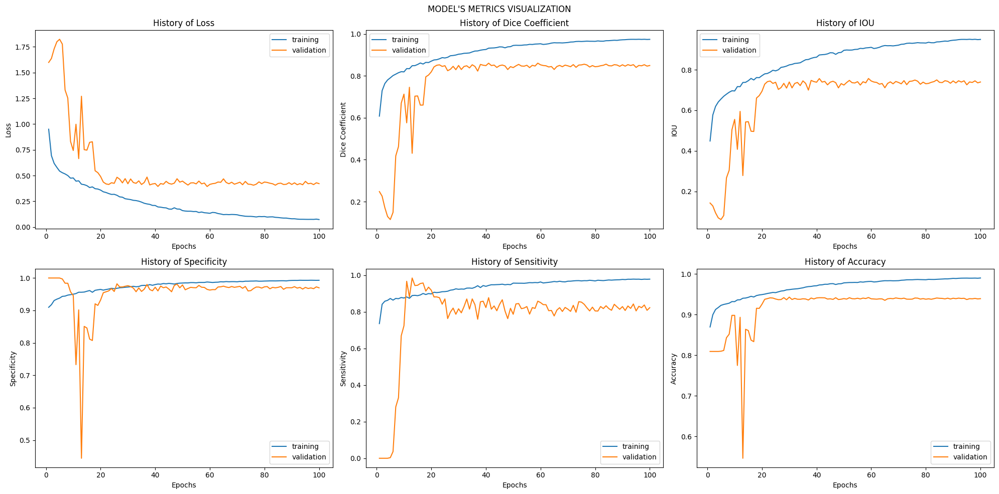

In [12]:
def Train_Val_Plot(loss, val_loss, dice_score, val_dice_score, iou, val_iou, specificity, val_specificity, sensitivity, val_sensitivity, accuracy, val_accuracy):
    fig, axs = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle("MODEL'S METRICS VISUALIZATION")

    # Loss plot
    axs[0, 0].plot(range(1, len(loss) + 1), loss)
    axs[0, 0].plot(range(1, len(val_loss) + 1), val_loss)
    axs[0, 0].set_title('History of Loss')
    axs[0, 0].set_xlabel('Epochs')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend(['training', 'validation'])

    # Dice Coefficient plot
    axs[0, 1].plot(range(1, len(dice_score) + 1), dice_score)
    axs[0, 1].plot(range(1, len(val_dice_score) + 1), val_dice_score)
    axs[0, 1].set_title('History of Dice Coefficient')
    axs[0, 1].set_xlabel('Epochs')
    axs[0, 1].set_ylabel('Dice Coefficient')
    axs[0, 1].legend(['training', 'validation'])

    # Mean IOU plot
    axs[0, 2].plot(range(1, len(iou) + 1), iou)
    axs[0, 2].plot(range(1, len(val_iou) + 1), val_iou)
    axs[0, 2].set_title('History of IOU')
    axs[0, 2].set_xlabel('Epochs')
    axs[0, 2].set_ylabel('IOU')
    axs[0, 2].legend(['training', 'validation'])

    # Recall plot
    axs[1, 0].plot(range(1, len(specificity) + 1), specificity)
    axs[1, 0].plot(range(1, len(val_specificity) + 1), val_specificity)
    axs[1, 0].set_title('History of Specificity')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].set_ylabel('Specificity')
    axs[1, 0].legend(['training', 'validation'])

    # Precision plot
    axs[1, 1].plot(range(1, len(sensitivity) + 1), sensitivity)
    axs[1, 1].plot(range(1, len(val_sensitivity) + 1), val_sensitivity)
    axs[1, 1].set_title('History of Sensitivity')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].set_ylabel('Sensitivity')
    axs[1, 1].legend(['training', 'validation'])

    # Accuracy plot
    axs[1, 2].plot(range(1, len(accuracy) + 1), accuracy)
    axs[1, 2].plot(range(1, len(val_accuracy) + 1), val_accuracy)
    axs[1, 2].set_title('History of Accuracy')
    axs[1, 2].set_xlabel('Epochs')
    axs[1, 2].set_ylabel('Accuracy')
    axs[1, 2].legend(['training', 'validation'])

    plt.tight_layout()
    plt.show()

Train_Val_Plot(
    history.history['loss'], history.history['val_loss'],
    history.history['dice_score'], history.history['val_dice_score'],
    history.history['iou'], history.history['val_iou'],
    history.history['specificity'], history.history['val_specificity'],
    history.history['sensitivity'], history.history['val_sensitivity'],
    history.history['accuracy'], history.history['val_accuracy']
)

## Testing

In [13]:
model.load_weights("/kaggle/working/model.weights.h5")
model.evaluate(X_test, y_test, batch_size = 4, verbose = 1)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.9353 - dice_score: 0.8362 - iou: 0.7190 - loss: 0.4449 - sensitivity: 0.8822 - specificity: 0.9487


[0.4365059435367584,
 0.9352102279663086,
 0.8395171165466309,
 0.8726709485054016,
 0.9515729546546936,
 0.7239769101142883]

In [14]:
modeller = Model(inputs=model.input, outputs=[model.get_layer(name="add_6").output,model.layers[-2].output])

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Feature Distance (Foreground vs. Background): [1.2620841] || Pixel Distance (Foreground vs. Background): [1.2974999]
Dice: 0.8652969598770142 || Accuracy: 0.94818115234375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.2430054] || Pixel Distance (Foreground vs. Background): [1.1309261]
Dice: 0.803342878818512 || Accuracy: 0.9273223876953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [1.276246] || Pixel Distance (Foreground vs. Background): [1.0648082]
Dice: 0.745980441570282 || Accuracy: 0.9380950927734375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [1.2027541] || Pixel Distance (Foreground vs. Background): [1.0579277]
Dice: 0.8476498126983643 || Accuracy: 0.92181396484375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.1521788] || Pixel Distance (Foreground vs. Background): [1.0478028]
Dice: 0.8844441771507263 || Accuracy: 0.947540283203125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [1.233564] || Pixel Distance (Foreground vs. Background): [1.0911198]
Dice: 0.8340656757354736 || Accuracy: 0.9715423583984375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Featur

/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [1.233262] || Pixel Distance (Foreground vs. Background): [1.0427642]
Dice: 0.8277910947799683 || Accuracy: 0.9656219482421875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.1637803] || Pixel Distance (Foreground vs. Background): [1.2297952]
Dice: 0.8560248017311096 || Accuracy: 0.916473388671875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.1170621] || Pixel Distance (Foreground vs. Background): [0.73792833]
Dice: 0.861270546913147 || Accuracy: 0.9619140625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [1.0743358] || Pixel Distance (Foreground vs. Background): [0.8889372]
Dice: 0.8656049966812134 || Accuracy: 0.9314117431640625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Feature 

/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [1.177915] || Pixel Distance (Foreground vs. Background): [1.1946843]
Dice: 0.7245699167251587 || Accuracy: 0.931610107421875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.1068012] || Pixel Distance (Foreground vs. Background): [1.1400988]
Dice: 0.8342770338058472 || Accuracy: 0.9031829833984375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Feature Distance (Foreground vs. Background): [1.2209634] || Pixel Distance (Foreground vs. Background): [1.1381346]
Dice: 0.8216236233711243 || Accuracy: 0.927215576171875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Feature Distance (Foreground vs. Background): [1.1399102] || Pixel Distance (Foreground vs. Background): [0.9689055]
Dice: 0.8058983683586121 || Accuracy: 0.908599853515625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


/tmp/ipykernel_34/1448502135.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 5, figsize=(20, 4))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [1.3256168] || Pixel Distance (Foreground vs. Background): [1.0782255]
Dice: 0.8480101823806763 || Accuracy: 0.976898193359375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.1567888] || Pixel Distance (Foreground vs. Background): [1.1794509]
Dice: 0.8810075521469116 || Accuracy: 0.9422760009765625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [1.2097155] || Pixel Distance (Foreground vs. Background): [1.3878304]
Dice: 0.8196622133255005 || Accuracy: 0.922088623046875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Feature Distance (Foreground vs. Background): [1.256258] || Pixel Distance (Foreground vs. Background): [1.1485614]
Dice: 0.8601887822151184 || Accuracy: 0.9514007568359375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1

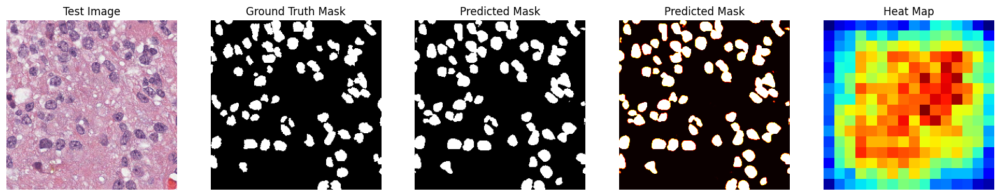

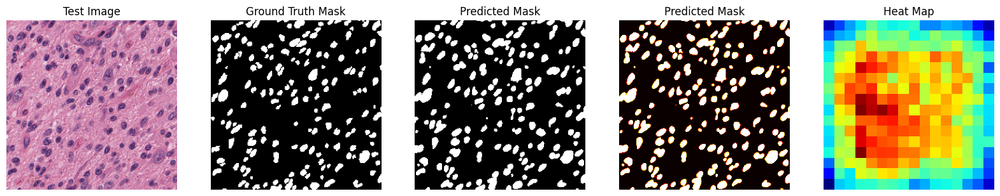

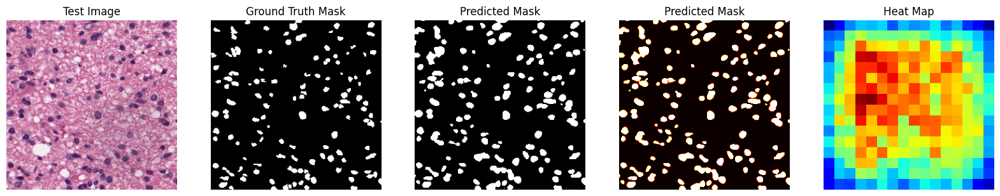

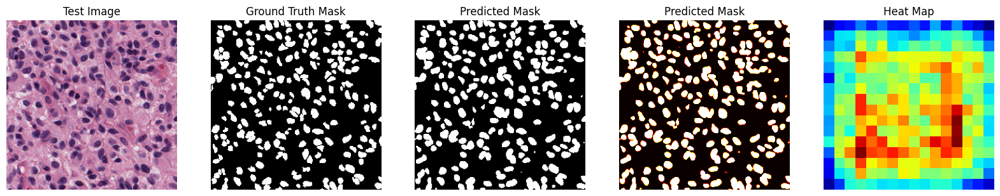

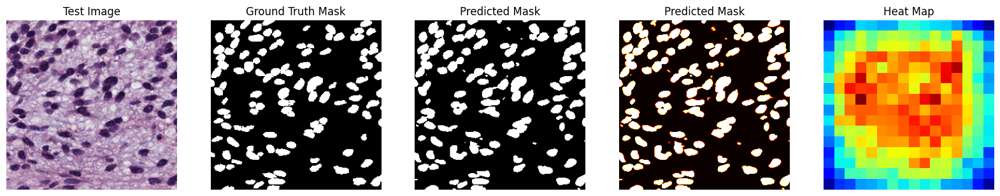

...

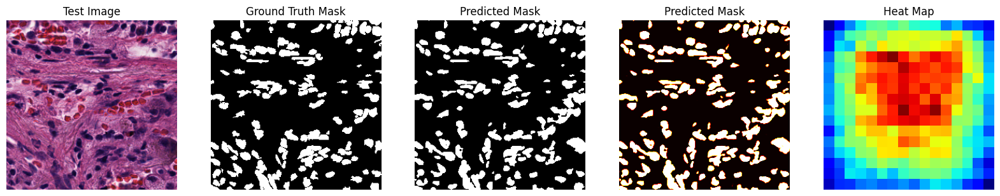

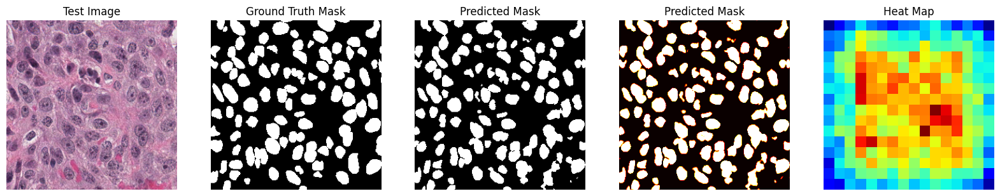

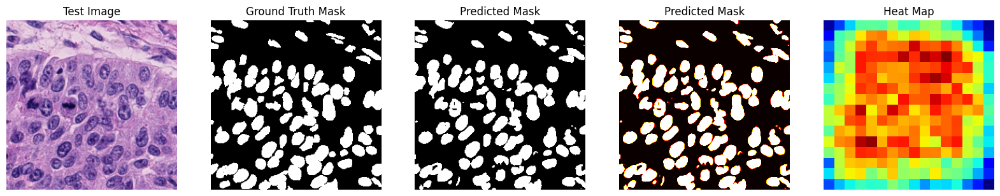

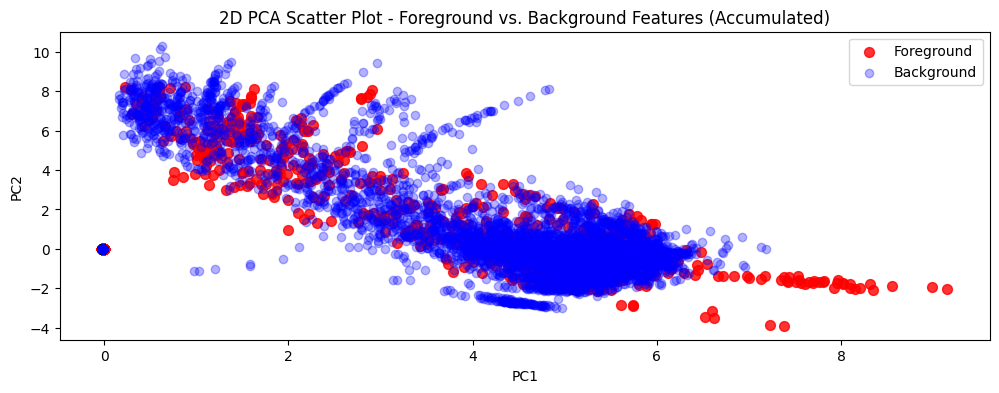

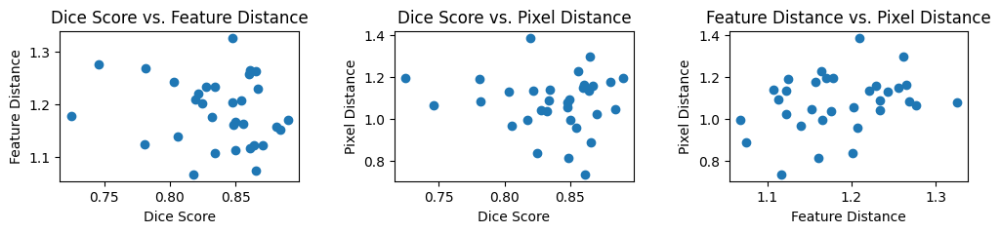

In [15]:
def extract_features(feature_map, mask):
    mask = tf.expand_dims(mask, axis=-1)
    fg_indices = tf.where(mask == 1)
    fg_feature = tf.gather_nd(feature_map, fg_indices)
    bg_indices = tf.where(mask == 0)
    bg_feature = tf.gather_nd(feature_map, bg_indices)
    return fg_feature, bg_feature

dice_scores = []
sim_scores = []
pix_scores = []
fg_features = []
bg_features = []

for z in range(0,32):
    test_image = X_test[z]  
    test_mask = y_test[z] 

    test_image = np.reshape(test_image, (1,) + test_image.shape)

    predicted_mask = model.predict(test_image)[0]
    heat_map, feat_map = modeller.predict(test_image)
    loss, acc, dice, sen, spe, iou = model.evaluate(test_image, tf.expand_dims(test_mask, axis=0), verbose = 0)
    dice_scores.append(dice)
    predicted_mask_binary = np.where(predicted_mask > 0.5, 1, 0) * 255
    
    fg_feat_map, bg_feat_map = extract_features(feat_map, test_mask)
    
    fg_pca = PCA(n_components=2)
    fg_pca.fit(fg_feat_map)
    fg_feature = tf.convert_to_tensor(fg_pca.transform(fg_feat_map.numpy()))
    fg_features.append(fg_feature.numpy())
    bg_pca = PCA(n_components=2)
    bg_pca.fit(bg_feat_map.numpy())
    bg_feature = tf.convert_to_tensor(bg_pca.transform(bg_feat_map.numpy()))
    bg_features.append(bg_feature.numpy())
    
    fg_feat_map = tf.math.reduce_mean(feat_map, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 1]  # foreground (GT 1)
    bg_feat_map = tf.math.reduce_mean(feat_map, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 0]  # background (GT 0)
    fg_feat_map = Dense(2000)(tf.expand_dims(fg_feat_map, axis=0))
    bg_feat_map = Dense(2000)(tf.expand_dims(bg_feat_map, axis=0))
    fg_feat_map = tf.math.reduce_mean(fg_feat_map, axis=1)
    bg_feat_map = tf.math.reduce_mean(bg_feat_map, axis=1)
    
    fg_pixel = tf.math.reduce_mean(test_image, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 1]  # foreground (GT 1)
    bg_pixel = tf.math.reduce_mean(test_image, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 0]  # background (GT 0)
    fg_pixel = Dense(2000)(tf.expand_dims(fg_pixel, axis=0))
    bg_pixel = Dense(2000)(tf.expand_dims(bg_pixel, axis=0))
    fg_pixel = tf.math.reduce_mean(fg_pixel, axis=1)
    bg_pixel = tf.math.reduce_mean(bg_pixel, axis=1)
    
    similarity = tf.norm(fg_feat_map - bg_feat_map, ord=2, axis=-1)
    sim_scores.append(similarity[0])
    
    pix = tf.norm(fg_pixel - bg_pixel, ord=2, axis=-1)
    pix_scores.append(pix[0])

    print("Feature Distance (Foreground vs. Background):", similarity.numpy(), "|| Pixel Distance (Foreground vs. Background):", pix.numpy())
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    # Plot the test image
    axes[0].imshow(test_image[0], cmap='gray')
    axes[0].set_title('Test Image')
    axes[0].axis('off')

    # Plot the ground truth mask
    axes[1].imshow(test_mask, cmap='gray')
    axes[1].set_title('Ground Truth Mask')
    axes[1].axis('off')
    
    # Plot the binarized predicted mask
    axes[2].imshow(predicted_mask_binary, cmap='gray')
    axes[2].set_title('Predicted Mask')
    axes[2].axis('off')

    # Plot the soft predicted mask
    axes[3].imshow(predicted_mask*255, cmap='hot')
    axes[3].set_title('Predicted Mask')
    axes[3].axis('off')
    
    # Plot the predicted mask
    axes[4].imshow(tf.math.reduce_mean(tf.math.reduce_mean(heat_map, axis=-1), axis=0), cmap='jet')
    axes[4].set_title('Heat Map')
    axes[4].axis('off')
    
    print("Dice:", dice, "|| Accuracy:", acc) 
    
fg_features_all = np.concatenate(fg_features, axis=0)
bg_features_all = np.concatenate(bg_features, axis=0)

plt.figure(figsize=(12, 4))
plt.scatter(fg_features_all[:, 0], fg_features_all[:, 1], c='red', label='Foreground', s=50, alpha=0.8)
plt.scatter(bg_features_all[:, 0], bg_features_all[:, 1], c='blue', label='Background', alpha=0.3)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('2D PCA Scatter Plot - Foreground vs. Background Features (Accumulated)')
plt.legend()
plt.show()
    
fig, axes = plt.subplots(1, 3, figsize=(12, 2))  
plt.subplots_adjust(wspace=0.4) 

axes[0].scatter(dice_scores, sim_scores)
axes[0].set_xlabel('Dice Score')
axes[0].set_ylabel('Feature Distance')
axes[0].set_title('Dice Score vs. Feature Distance')

axes[1].scatter(dice_scores, pix_scores)
axes[1].set_xlabel('Dice Score')
axes[1].set_ylabel('Pixel Distance')
axes[1].set_title('Dice Score vs. Pixel Distance')

axes[2].scatter(sim_scores, pix_scores)
axes[2].set_xlabel('Feature Distance')
axes[2].set_ylabel('Pixel Distance')
axes[2].set_title('Feature Distance vs. Pixel Distance')

plt.show()